# Проект: Маркетинговый анализ Яндекс.Афиши

## Описание проекта


Вас пригласили на стажировку в отдел маркетинговой аналитики Яндекс.Афиши. Первое задание: помочь маркетологам снизить расходы — отказаться от невыгодных источников трафика и перераспределить бюджет.

Есть данные Яндекс.Афиши с июня 2017 по конец мая 2018 года:
- лог сервера с данными о посещениях сайта Яндекс.Афиши,
- выгрузка всех заказов за этот период,
- статистика рекламных расходов.

Вам предстоит изучить:
- как клиенты пользуются сервисом,
- когда делают первые покупки на сайте,
- сколько денег приносит компании каждый клиент,
- когда расходы на привлечение клиента окупаются.

Выручка измеряется в условных единицах — у.е.

## Оглавление:

[Шаг 1. Открытие данных и подготовка к анализу](#1)
* [1.1 Импорт библиотек и открытие данных](#11)
* [1.2 Предобработка данных](#12)

[Шаг 2. Расчет метрик](#2)
* [2.1 Продуктовые метрики](#21)
    * [2.1.1 DAU, WAU, MAU](#211)
    * [2.1.2 Количество сессий в день](2#12)
    * [2.1.3 ASL](#213)
    * [2.1.4 Retention Rate](#214)
* [2.2 Метрики электронной коммерции](#22)
    * [2.2.1 Количество времени с момента первого посещения сайта до покупки](#221)
    * [2.2.2 Среднее количество покупок на одного покупателя за 6 месяцев](#222)
    * [2.2.3 Средний чек](#223)
    * [2.2.4 LTV](#224)
* [2.3 Маркетинговые метрики](#23)
    * [2.3.1 Расходы на маркетинг](#231)
    * [2.3.2 CAC](#232)
    * [2.3.3 Расчет ROMI](#233)

[Шаг 3. Выводы и рекомендации](#3)
* [3.1 Источники трафика](#31)
* [3.2 Обзор метрик](#32)
* [3.3 Перспективные когорты](#33)


# Шаг 1. Открытие данных и подготовка к анализу <a id="1"></a>

## 1.1 Импорт библиотек и открытие данных <a id="11"></a>

Импортируем библиотеки

In [1]:
import pandas as pd
import numpy as np
import plotly.express as px
import plotly.graph_objects as go
import seaborn as sns
from matplotlib import pyplot as plt

from IPython.display import display

import warnings
warnings.filterwarnings('ignore')

Откроем файлы с помощью метода try - except

In [2]:
try:
    visits = pd.read_csv('visits_log.csv')
    orders = pd.read_csv('orders_log.csv')
    costs = pd.read_csv('costs.csv')
except:
    visits = pd.read_csv('/datasets/visits_log.csv')
    orders = pd.read_csv('/datasets/orders_log.csv')
    costs = pd.read_csv('/datasets/costs.csv')

Чтобы прочитать файлы сразу, напишем функцию и выведем в цикле первые 5 строк и информацию таблице.

Сохраним наши таблицы в переменной data_list.

In [3]:
data_list = [visits, orders, costs]

Напишем функцию table_info.

In [4]:
def table_info(data):
    display(data.head())
    display(data.info())
    print()

Выведем в цикле информацию о таблице

In [5]:
for i in data_list:
    table_info(i)

,Device,End Ts,Source Id,Start Ts,Uid
0,touch,2017-12-20 17:38:00,4,2017-12-20 17:20:00,16879256277535980062
1,desktop,2018-02-19 17:21:00,2,2018-02-19 16:53:00,104060357244891740
2,touch,2017-07-01 01:54:00,5,2017-07-01 01:54:00,7459035603376831527
3,desktop,2018-05-20 11:23:00,9,2018-05-20 10:59:00,16174680259334210214
4,desktop,2017-12-27 14:06:00,3,2017-12-27 14:06:00,9969694820036681168


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 359400 entries, 0 to 359399
Data columns (total 5 columns):
Device       359400 non-null object
End Ts       359400 non-null object
Source Id    359400 non-null int64
Start Ts     359400 non-null object
Uid          359400 non-null uint64
dtypes: int64(1), object(3), uint64(1)
memory usage: 13.7+ MB


None

,Buy Ts,Revenue,Uid
0,2017-06-01 00:10:00,17.00,10329302124590727494
1,2017-06-01 00:25:00,0.55,11627257723692907447
2,2017-06-01 00:27:00,0.37,17903680561304213844
3,2017-06-01 00:29:00,0.55,16109239769442553005
4,2017-06-01 07:58:00,0.37,14200605875248379450


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50415 entries, 0 to 50414
Data columns (total 3 columns):
Buy Ts     50415 non-null object
Revenue    50415 non-null float64
Uid        50415 non-null uint64
dtypes: float64(1), object(1), uint64(1)
memory usage: 1.2+ MB


None

,source_id,dt,costs
0,1,2017-06-01,75.20
1,1,2017-06-02,62.25
2,1,2017-06-03,36.53
3,1,2017-06-04,55.00
4,1,2017-06-05,57.08


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2542 entries, 0 to 2541
Data columns (total 3 columns):
source_id    2542 non-null int64
dt           2542 non-null object
costs        2542 non-null float64
dtypes: float64(1), int64(1), object(1)
memory usage: 59.7+ KB


None

### Вывод

У нас есть три таблицы visits, orders, costs.

Таблица visits хранит лог сервера с информацией о посещениях сайта, orders — информацию о заказах, а costs — информацию о расходах на маркетинг.

Структура visits:
- Uid — уникальный идентификатор пользователя,
- Device — категория устройства пользователя,
- Start Ts — дата и время начала сессии,
- End Ts — дата и время окончания сессии,
- Source Id — идентификатор источника перехода на сайт.

Структура orders:
- Uid — уникальный идентификатор пользователя,
- Buy Ts — дата и время заказа,
- Revenue — сумма заказа.

Структура costs.csv
- source_id — идентификатор рекламного источника,
- dt — дата проведения рекламной кампании,
- costs — расходы на эту кампанию.

В таблицах visits и order названия стоит переименовать и привести к нижнему регистру. А так же столбцы 'start_ts', 'end_ts', 'buy_ts', 'dt' привести к формату datetime. 

## 1.2 Предобработка данных <a id="12"></a>

Переименуем наши столбцы и приведем их к одному регистру.

Для это воспользуемся переменной data_list.
В цикле заменим пробелы на нижнее подчеркивание, применим метод .lower()
Веведем названия столбцов.

In [6]:
for i in data_list:
    cols = i.columns.str.replace(" ", "_")
    cols.tolist()
    new_cols = [col.lower() for col in cols]
    i.columns = new_cols    
    print(i.columns)

Index(['device', 'end_ts', 'source_id', 'start_ts', 'uid'], dtype='object')
Index(['buy_ts', 'revenue', 'uid'], dtype='object')
Index(['source_id', 'dt', 'costs'], dtype='object')


Все получилось.

Поменяем 'start_ts', 'end_ts', 'buy_ts', 'dt' на тип данных datetime. Сохраним их в переменную columns.

In [7]:
columns = ['start_ts', 'end_ts', 'buy_ts', 'dt']

В цикле поменяем тип данных

In [8]:
for df in [visits, orders, costs]:
    for col in df:
        if col in columns:
            df[col] = pd.to_datetime(df[col])

Проверим как все получилось

In [9]:
for i in data_list:
    table_info(i)

,device,end_ts,source_id,start_ts,uid
0,touch,2017-12-20 17:38:00,4,2017-12-20 17:20:00,16879256277535980062
1,desktop,2018-02-19 17:21:00,2,2018-02-19 16:53:00,104060357244891740
2,touch,2017-07-01 01:54:00,5,2017-07-01 01:54:00,7459035603376831527
3,desktop,2018-05-20 11:23:00,9,2018-05-20 10:59:00,16174680259334210214
4,desktop,2017-12-27 14:06:00,3,2017-12-27 14:06:00,9969694820036681168


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 359400 entries, 0 to 359399
Data columns (total 5 columns):
device       359400 non-null object
end_ts       359400 non-null datetime64[ns]
source_id    359400 non-null int64
start_ts     359400 non-null datetime64[ns]
uid          359400 non-null uint64
dtypes: datetime64[ns](2), int64(1), object(1), uint64(1)
memory usage: 13.7+ MB


None

,buy_ts,revenue,uid
0,2017-06-01 00:10:00,17.00,10329302124590727494
1,2017-06-01 00:25:00,0.55,11627257723692907447
2,2017-06-01 00:27:00,0.37,17903680561304213844
3,2017-06-01 00:29:00,0.55,16109239769442553005
4,2017-06-01 07:58:00,0.37,14200605875248379450


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50415 entries, 0 to 50414
Data columns (total 3 columns):
buy_ts     50415 non-null datetime64[ns]
revenue    50415 non-null float64
uid        50415 non-null uint64
dtypes: datetime64[ns](1), float64(1), uint64(1)
memory usage: 1.2 MB


None

,source_id,dt,costs
0,1,2017-06-01,75.20
1,1,2017-06-02,62.25
2,1,2017-06-03,36.53
3,1,2017-06-04,55.00
4,1,2017-06-05,57.08


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2542 entries, 0 to 2541
Data columns (total 3 columns):
source_id    2542 non-null int64
dt           2542 non-null datetime64[ns]
costs        2542 non-null float64
dtypes: datetime64[ns](1), float64(1), int64(1)
memory usage: 59.7 KB


None

Названия столбцов изменены, тип данных поменяли. Можно переходить к анализу

# Шаг 2. Расчет метрик <a id="2"></a>

В этом шаге мы будем считать метрики трёх видов.
- продуктовые
- метрики электронной коммерции
- маркетинговые

## 2.1 Продуктовые метрики <a id="21"></a>

В этом пункте мы рассмотрим такие показатели как, DAU, WAU, MAU, сколько раз за день пользователи заходят на сайт, ASL, и с помощью когортного анализа рассчитаем Retention Rate.

### 2.1.1 DAU, WAU, MAU <a id="211"></a>

Рассчитаем количество уникальных польлзователей в день, неделю и месяц.

Для удобства восприятия поменяем местами столбцы в таблице visits

In [10]:
visits = visits[['uid', 'device','source_id', 'start_ts', 'end_ts']]

Добавим столбцы session_date, session_week, session_month, session_year и методом astype(datetime[ ]) приведем их к нужному отрезку времени.
Выведем первые 3 строки.

In [11]:
visits['session_date'] = visits['start_ts'].astype('datetime64[D]')
visits['session_week'] = visits['start_ts'].astype('datetime64[W]')
visits['session_month'] = visits['start_ts'].astype('datetime64[M]')
visits['session_year'] = visits['start_ts'].astype('datetime64[Y]')
visits.head(3)

,uid,device,source_id,start_ts,end_ts,session_date,session_week,session_month,session_year
0,16879256277535980062,touch,4,2017-12-20 17:20:00,2017-12-20 17:38:00,2017-12-20,2017-12-14,2017-12-01,2017-01-01
1,104060357244891740,desktop,2,2018-02-19 16:53:00,2018-02-19 17:21:00,2018-02-19,2018-02-15,2018-02-01,2018-01-01
2,7459035603376831527,touch,5,2017-07-01 01:54:00,2017-07-01 01:54:00,2017-07-01,2017-06-29,2017-07-01,2017-01-01


Все получилось.

Теперь в переменные day, week, month сохраним информацию по количеству уникальных значений из столбца uid по временным отрезкам соответственно.

In [12]:
day = visits.groupby('session_date').agg({'uid':'nunique'}).reset_index()
week = visits.groupby(['session_year', 'session_week']).agg({'uid':'nunique'}).reset_index()
month = visits.groupby(['session_year', 'session_month']).agg({'uid':'nunique'}).reset_index()

Рассчитаем DAU, WAU, MAU

In [13]:
dau = day['uid'].mean()
wau = week['uid'].mean()
mau = month['uid'].mean()

In [14]:
print(dau)
print(wau)
print(mau)

907.9917582417582
5621.7037037037035
23228.416666666668


Уникальных пользователей в день - 907.9
Уникальных пользователей в неделю - 5621.7
Уникальных пользователей в месяц - 23228.4

Построим график, на котором посмотрим как изменялось количество пользователей во времени.

In [15]:
fig = go.Figure()

fig.add_trace(go.Scatter(x=day['session_date'], y=day['uid'], name='Пользователей в день'))
fig.add_trace(go.Scatter(x=week['session_week'], y=week['uid'], name='Пользователей в неделю'))
fig.add_trace(go.Scatter(x=month['session_month'], y=month['uid'], name='Пользователей в месяц'))

fig.update_layout(title='Пользователей на сайте в динамике',
                   xaxis_title='Месяц',
                   yaxis_title='Кол-во пользователей')

fig.show()

### Вывод

Как можно видеть по графику ежемесячному, с августа по ноябрь идет рост числа пользователей, затем небольшой отток.
Еженедельный график показывает такую же тенденцию с августа по ноябрь, но менее стабилен позже.
График ежедневный визуально имеет постепенный рост на протяжении всего периода, затем с марта количество пользователей все меньше.

Предположу, что такая картина произошла по причине того, что с августа приходило много новых пользователей, собралась аудитория, затем приток новых пользователей замедлился. Так же стоит учитывать сезонность. Летом и в новогодние праздники многие уезжают в отпуск.

### 2.1.2 Количество сессий в день <a id="212"></a>

Посмотрик как часто в день пользователи заходят на сервис.

Для этого найдем количество сессий в день и количество уникальных пользователей в день.Поделим друг на друга и найдем количество сессий на одного пользователя. 

In [16]:
sessions_count = visits.groupby('session_date').agg({'uid': ['count', 'nunique']}).reset_index()
sessions_count.columns = ['session_date', 'n_sessions', 'n_users']
sessions_count['sessions_per_user'] = sessions_count['n_sessions'] / sessions_count['n_users']
sessions_count.head()

,session_date,n_sessions,n_users,sessions_per_user
0,2017-06-01,664,605,1.097521
1,2017-06-02,658,608,1.082237
2,2017-06-03,477,445,1.071910
3,2017-06-04,510,476,1.071429
4,2017-06-05,893,820,1.089024


Мы нашли количество сессий на одного пользователя в каждый день.

Построим график и найдем среднее количество посещений за все время.

In [17]:
fig = px.line(sessions_count, x="session_date", y="sessions_per_user", title='Количество сессий на одного человека в динамике', labels={'session_date':'Дата сессии', 'sessions_per_user':'Кол-во сессий на одного пользователя'})
fig.show()

print('Среднее количество посещений сайта в день:' ,sessions_count['sessions_per_user'].mean())

Среднее количество посещений сайта в день: 1.082169644003972


### Вывод

Среднее посещение в день состовляет около 1.08

По графику можно сказать,что посещение сайта не сильно меняется со временем. Стоит отметить,что очень высокие значения 24 и 28 ноября 2017 года, и низкие 21 марта 2018 относительно всего времени.

### 2.1.3 ASL <a id="213"></a>

Рассчитаем как долго люди проводят времени на сайте. Для этого вычтем из столбца end_ts значения start_ts. Создадим столбец session_duration.

In [18]:
visits['session_duration'] = (visits['end_ts'] - visits['start_ts']).dt.seconds

Рассчитаем ASL, по столбцу session_duration выведем моду.

In [19]:
asl = visits['session_duration'].mode()

In [20]:
asl

0    60
dtype: int64

Как правило, пользователя проводят одну минуту на сайте.

Построим гистограмму. Ограничим значения до 5000 секунд, так как предполагаем, что при моде в 60 секунд, пользователи маловероятно проводят  времени более чем 83 минуты.

In [21]:
fig = go.Figure()
fig.add_trace(go.Histogram(x=visits['session_duration'], xbins=dict(start=0, end=5000)))
fig.update_layout(
    xaxis_title_text='Длина сессии', 
    yaxis_title_text='Количество пользователей', title='Проведенное время на сайте')

### Вывод

Судя по графику, количество пользователей, которые пользуются сайтом дольше, все меньше и меньше.

### 2.1.4 Retention Rate <a id="214"></a>

Рассмотрим сколько людей возвращается каждый месяц относительно их изначального числа. Рассичтаем Retention Rate с помощью когортного анализа.

Найдем, когда каждый пользователь зашел на сайт в первый раз.
Создадим таблицу first_activity_date сгруппировав по id пользователя и найдем первое появление на сайте.

In [22]:
first_activity_date = visits.groupby(['uid'])['session_date'].min()
first_activity_date.name = 'first_activity_date'

Присоеденим первое появления на сайте к visits по уникальному пользователю

In [23]:
visits = visits.join(first_activity_date, on = 'uid')

Найдем первый месяц появления на сайте

In [24]:
visits['first_activity_month'] = visits['first_activity_date'].astype('datetime64[M]')

Найдем этап "жизни" когорты. Вычтем из месяца сесии месяц первого появления на сайте. Огруглим значения и приведем к типу int

In [25]:
visits['cohort_lifetime'] = (visits['session_month'] - visits['first_activity_month'])
visits['cohort_lifetime'] = visits['cohort_lifetime'] / np.timedelta64(1, 'M')
visits['cohort_lifetime'] = round(visits['cohort_lifetime']).astype('int')

Выделим когорты. Сгруппируем по первому месяцу появления на сайте и этапу жизни когорты, посчитает количествоП пользователей.

In [26]:
cohorts = visits.groupby(['first_activity_month','cohort_lifetime']).agg({'uid':'nunique'}).reset_index() 

Посчитаем количество первоначальных пользователей в первом этапе жизни когорты

In [27]:
initial_users_count = cohorts[cohorts['cohort_lifetime'] == 0][
    ['first_activity_month', 'uid']]
initial_users_count = initial_users_count.rename(columns={'uid':'cohort_users'})

Соеденим количество первоначальных пользователей с когортами по первому месяцу появления.

In [28]:
cohorts = cohorts.merge(initial_users_count,on='first_activity_month')

Рассчитаем Retention Rate, поделим количество первоначальных польщователей на количество пользователей в когорте.

In [29]:
cohorts['retention'] = cohorts['uid']/cohorts['cohort_users'] 

Для удобства отображения ограничим вывод когорты до месяцев

In [30]:
cohorts ['first_activity_month'] = cohorts['first_activity_month'].dt.strftime('%Y-%m')

Сделаем сводную таблицу retention_pivot

In [31]:
retention_pivot = cohorts.pivot_table(
    index='first_activity_month',
    columns='cohort_lifetime',
    values='retention',
    aggfunc='sum',
) 

Ограничим таблицу, уберем первый этап жизни когорты, так там будет 100%

In [32]:
retention_pivot.drop(0, axis = 1, inplace = True)
retention_pivot.drop(retention_pivot.tail(1).index, inplace = True)

С помощью библиотеки seaborn выведем тепловую карту.

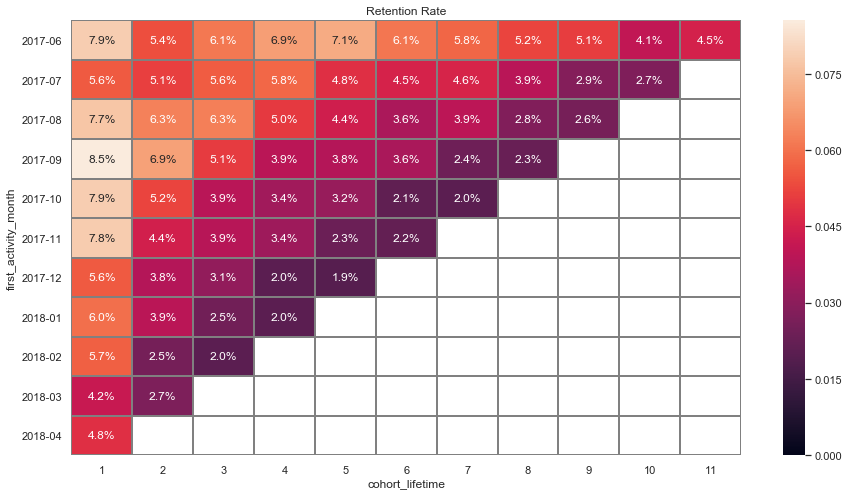

In [33]:
sns.set(style='white')
plt.figure(figsize=(15, 8))
plt.title('Retention Rate')
sns.heatmap(retention_pivot, annot=True, fmt='.1%', linewidths=1, linecolor='gray', vmin = False); 

Рассчитаем средний Retention Rate на второй месяц когорты

In [34]:
m2_retention_pivot = retention_pivot.cumsum(axis=1).mean(axis=0)[1]
print('{:.1%}'.format(m2_retention_pivot))

6.5%


### Вывод

По тепловой карте можно сказать следующее:
- со следующим этапом жизни когорты количество пользователей уменьшается
- в первых двух когортах есть этапы, когда Retention Rate увеличивался

На второй месяц когорт средний Retention Rate составляет 6.5%

## 2.2 Метрики электронной коммерции <a id="22"></a>

В этом пунке мы исследуем сколько времени проходит с первого посещения сайта до покупки, сколько покупок на одного покупателя приходится за 6 месяцев, рассчитаем средний чек по разным месяцам и выясним как меняется LTV на покупателя по когортам.

### 2.2.1 Количество времени с момента первого посещения сайта до покупки <a id="221"></a>

Для поиска этого показателя найдем первые посещения пользователей. Сохраним их в переменную first_visit

In [35]:
first_visit = visits.groupby('uid')['start_ts'].min().reset_index()

Объеденим с таблицей orders

In [36]:
orders = orders.merge(first_visit, on ='uid', how='left')

In [37]:
orders.head(3)

,buy_ts,revenue,uid,start_ts
0,2017-06-01 00:10:00,17.00,10329302124590727494,2017-06-01 00:09:00
1,2017-06-01 00:25:00,0.55,11627257723692907447,2017-06-01 00:14:00
2,2017-06-01 00:27:00,0.37,17903680561304213844,2017-06-01 00:25:00


Сгруппируем таблицу orders по id пользователя и первому посещений, найдем первую покупку пользователя

In [38]:
first_order = orders.groupby(['uid','start_ts'])['buy_ts'].min().reset_index()
first_order.head(3)

,uid,start_ts,buy_ts
0,313578113262317,2017-09-18 22:49:00,2018-01-03 21:51:00
1,1575281904278712,2017-06-03 10:13:00,2017-06-03 10:13:00
2,2429014661409475,2017-10-11 17:14:00,2017-10-11 18:33:00


Из первой покупки пользователя, вычтем первое появление на сайте

In [39]:
first_order['time_to_order'] = (first_order['buy_ts'] - first_order['start_ts']).dt.seconds

Найдем моду столбца time_to_order

In [40]:
time_to_orders = first_order['time_to_order'].mode()
time_to_orders

0    60
dtype: int64

Построим гистограмму, по столбцу time_to_order, чтобы найти распределение этого показателя

In [41]:
fig = px.histogram(first_order, x="time_to_order", title='Время от первого посещения до первой покупки', labels={'time_to_order':'Время первой покупки', 'count':'Кол-во пользователей'})
fig.show()

### Вывод

По графику видно, что большая часть людей на сайте прибывают малое количество времени. За 60 секунд они успевают сделать покупку.

### 2.2.2 Среднее количество покупок на одного покупателя за 6 месяцев <a id="222"></a>

Для нахождения среднего количества покупок на одного покупателя применим когортный анализ.

Для этого найдем первый месяц покупки каждого пользователя. Для этого найдем месяц каждой покупки.

In [42]:
orders['order_month'] = orders['buy_ts'].astype('datetime64[M]')

first_orders = orders.groupby('uid').agg({'order_month':'min'}).reset_index()

first_orders.columns = ['uid', 'first_order_month']

Найдем количество покупателей в каждой когорте по первому месяцу покупки.

In [43]:
cohort_sizes = (
    first_orders.groupby('first_order_month')
    .agg({'uid': 'nunique'})
    .reset_index()
)

cohort_sizes.columns = ['first_order_month', 'n_buyers']

Объединим таблицы order и first_orders по id пользователя.

In [44]:
orders_first_month = pd.merge(orders, first_orders, on ='uid')

Выделим когорты и посчитаем количество покупок

In [45]:
cohorts = orders_first_month.groupby(['first_order_month', 'order_month']).agg({'uid': 'count'}).reset_index()

К когортам присоединим количество пользователей когорт к когортам.

In [46]:
report = pd.merge(cohort_sizes, cohorts, on = 'first_order_month')

Создадим столбец с этапами жизни когорт.

In [47]:
report['age'] = (report['order_month'] - report['first_order_month'])/np.timedelta64(1, 'M')
report['age'] = report['age'].round().astype('int')

Посчитаем количество покупок на одного покупателя. Поделим количество покупок на количество покупателей.

In [48]:
report['n_buy'] = report['uid'] / report['n_buyers']

In [49]:
report['first_order_month'] = report['first_order_month'].dt.strftime('%Y-%m')

Сформируем сводную таблицу по когортам и посчитаем среднее количество покупок во времени.

In [50]:
result = report.pivot_table(index = 'first_order_month', columns = 'age', values = 'n_buy', aggfunc = 'mean')

Применим метод cumsum, так как эта метрика накопительная

In [51]:
result = result.cumsum(axis = 1)

Построим тепловую карту

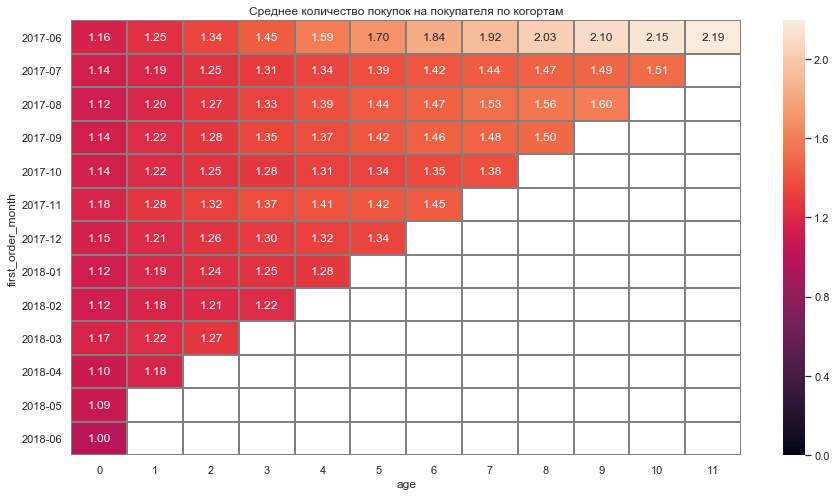

In [52]:
sns.set(style='white')
plt.figure(figsize=(15, 8))
plt.title('Среднее количество покупок на покупателя по когортам')
sns.heatmap(result, annot=True, fmt='.2f', linewidths=1, linecolor='gray', vmin = False); 

Посчитаем среднее количество покупок на одного покупателя за 6 месяцев

In [53]:
m6_cum = result.mean(axis=0)[5]
m6_cum

1.4341911542792218

### Вывод

Как можно судить по графику, в каждой когорте идет равномерный прирост количества покупок на человека.
Среднее количество покупок на одного человека за 6 месяцев: 1.43



### 2.2.3 Средний чек <a id="223"></a>

Рассчитаем средний чек по времени покупки. Сгруппируем по месяцу заказа средние чек покупки.

In [54]:
aov = orders.groupby('order_month')['revenue'].mean().reset_index()

In [55]:
aov.sort_values(by = 'revenue', ascending = False)

,order_month,revenue
6,2017-12-01,5.852139
3,2017-09-01,5.416448
9,2018-03-01,5.413930
1,2017-07-01,5.306589
10,2018-04-01,5.150645
4,2017-10-01,4.928280
2,2017-08-01,4.847139
8,2018-02-01,4.840095
5,2017-11-01,4.783518
11,2018-05-01,4.771279


Как мы можем видеть, самый высокий средний чек в декабре, а самый низкий в январе.
Построим график.

In [56]:
fig = px.line(aov, x="order_month", y="revenue", title='Средний чек', labels={'order_month':'Месяц', 'revenue':'Средний чек'})
fig.show()

Найдем средний чек за все время

In [57]:
print(aov['revenue'].mean())

4.838699619166338


### Вывод

Средний чек колеблется в диапазоне от 4 до 5,5. Видно резкий взлет среднего чека в декабря и спад в январе. Можно сделать вывод, что перед новогодними праздниками люди покупают больше и дороже. 

Средний чек за все вресмя составляет - 4.83

### 2.2.4 LTV <a id="224"></a>

Выясним как меняется показатель LTV на покупателя по когортам. 

Возьмем таблицу orders_first_month и сгруппируем когорты с суммами продаж.
Объединим с cohort_sizes, выведем этапы жизни пользователя и рассчитаем LTV поделив сумму продаж на количество покупателей.
Затем сделаем сводную таблицу с когортами и LTV, оставим только те, которые прожили 6 месяцев. Построим тепловую карту.

In [58]:
cohorts_ltv = orders_first_month.groupby(['first_order_month', 'order_month']).agg({'revenue': 'sum'}).reset_index()
report_ltv = pd.merge(cohort_sizes, cohorts_ltv, on='first_order_month')
report_ltv['age'] = (
    report_ltv['order_month'] - report_ltv['first_order_month']
) / np.timedelta64(1, 'M')
report_ltv['age'] = report_ltv['age'].round().astype('int')
report_ltv['ltv'] = report_ltv['revenue'] / report_ltv['n_buyers']
report_ltv['first_order_month'] = report_ltv['first_order_month'].dt.strftime('%Y-%m')
result_ltv = report_ltv.pivot_table(
    index='first_order_month', columns='age', values='ltv', aggfunc='mean')
result_ltv = result_ltv.cumsum(axis = 1)


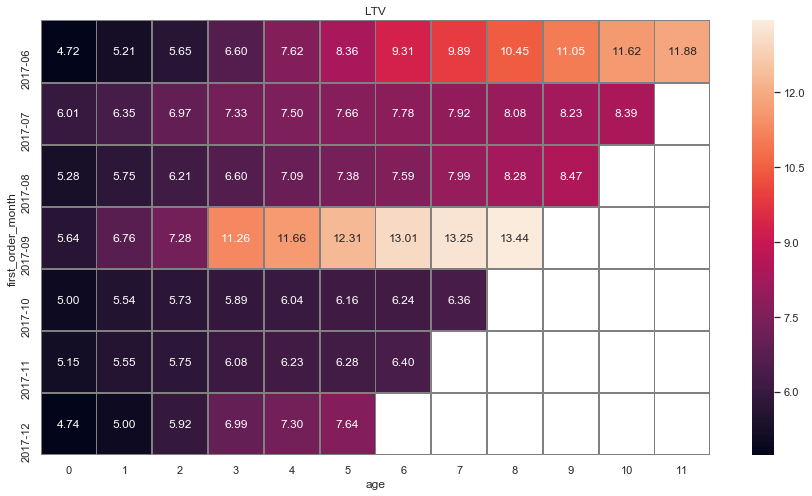

In [59]:
sns.set(style='white')
plt.figure(figsize=(15, 8))
plt.title('LTV')
sns.heatmap(result_ltv[:7], annot=True, fmt='.2f', linewidths=1, linecolor='gray')

Посчитаем средний LTV по когортам за 6 месяцев.

In [60]:
m6_cum_ltv = result.cumsum(axis=1).mean(axis=0)[5]
m6_cum_ltv

7.820097325169913

### Вывод

Судя по тепловой карте, когорты 2017-06 и 2017-09 имеет самый высокий LTV во времени. В этих когортах этот показатель растет явно активнее других.

Средний LTV по когортам за 6 месяцев: 7.82

## 2.3 Маркетинговые метрики <a id="23"></a>

На этом этапе мы рассмотрим общую сумму расходов на маркетинг,рассчитаем среднюю стоимость привлечения одного клиента для всего проекта и для каждого источника и рассчитаем возврат маркетинговых затрат по источнику трафика.

### 2.3.1 Расходы на маркетинг <a id="231"></a>

Сложим все расходы на маркетинг в выведем сумму.

In [61]:
total_costs = costs['costs'].sum()
total_costs

329131.62

Рассчитаем затраты по источникам. Сгруппируем по источникам и сложим затраты.

In [62]:
traffic_source = costs.pivot_table(
    index = 'source_id', 
    values = 'costs', 
    aggfunc = 'sum'
).sort_values(ascending = False, by = 'costs'
             ).reset_index()

По сводной таблице traffic_source построим график

In [63]:
fig = px.bar(traffic_source, x='source_id', y='costs', title='Расходы на каждый источник', labels={'source_id':'Источник', 'costs':'Расходы'})
fig.show()

Далее рассмотри как изменялись затраты по источникам во времени.

Выведем месяц каждой затраты, сгруппируем по месяцу и источнику затрат.

In [64]:
costs['month'] = costs['dt'].astype('datetime64[M]')

In [65]:
monthly_costs = costs.pivot_table(index = ['month', 'source_id'], values = 'costs', aggfunc = 'sum').reset_index()

Построим график с затратами по сводной таблице

In [66]:
fig = px.line(monthly_costs, x="month", y="costs", color='source_id', title='Расходы на каждый источник в динамике', labels={'month':'Месяц', 'costs':'Расходы'})
fig.show()

### Вывод

Общая сумма затрат на маркетинг: 329131.62

Анализируя получившиеся графики, больше всег затрат было на 3 источник, меньше всего на 9 и 10.

С августа 2017 года увеличились затраты на все виды источников. 

График затрат по 3 источнику напоминает график с уникальными пользователями помесячно, что говорит о том, что это источник, вероятнее всего, привлек большее количество людей.

### 2.3.2 CAC <a id="232"></a>

Для нахождения средний стоимости привлечения одного клиента, сгруппируем таблицу costs по столбцам month и source_id. Найдем на каждый источник помесечные траты.

In [67]:
monthly_costs_source = costs.groupby(['month','source_id'])['costs'].sum()

Найдем пользователей, которые по источнику прошли первый раз в первый месяц

In [68]:
users = visits.groupby('uid').agg({'source_id':'first', 'session_month':'first'}).reset_index().rename(columns = {'session_month':'month'})

Среди этих пользователей найдем тех, которые совершили покупки

In [69]:
buyers = users.query('uid in @orders.uid')

Сгруппируем по месяцу и источнику трафика, посчитаем количество пользователей

In [70]:
buyers = buyers.groupby(['month','source_id']).agg({'uid':'nunique'})

Теперь объединим по месяцу и источнику пользователей и стоимость их привлечения.

In [71]:
report_cac = buyers.join(monthly_costs_source).reset_index()

Рассчитаем САС поделив застраты на количество пользователей

In [72]:
report_cac['cac'] = report_cac['costs'] / report_cac['uid']

In [73]:
report_cac

,month,source_id,uid,costs,cac
0,2017-06-01,1,195,1125.61,5.772359
1,2017-06-01,2,226,2427.38,10.740619
2,2017-06-01,3,560,7731.65,13.806518
3,2017-06-01,4,409,3514.80,8.593643
4,2017-06-01,5,377,2616.12,6.939310
...,...,...,...,...,...
80,2018-05-01,3,711,9411.42,13.236878
81,2018-05-01,4,746,4214.21,5.649075
82,2018-05-01,5,517,3669.56,7.097795
83,2018-05-01,9,99,362.17,3.658283


Посчитаем средний САС по источникам трафика

In [74]:
source_cac = report_cac.groupby('source_id').agg({'uid':'sum','cac':'mean'}).reset_index()
source_cac

,source_id,uid,cac
0,1,3743,5.689214
1,2,4323,10.269348
2,3,9138,15.745618
3,4,9823,6.789339
4,5,6839,7.559450
5,7,1,NaN
6,9,1415,4.244540
7,10,1241,5.180461


Посчитаем САС по всему проекту

In [75]:
cac_mean = report_cac['cac'].mean()
cac_mean

7.925424215692033

Теперь построим график по средней стоимости привлечения клиента, где изобразим как изменялся показатель во времени у разных источников

In [76]:
fig = px.line(report_cac, x="month", y="cac", color='source_id', title='САС в динамике', labels={'month':'Месяц', 'cac':'CAC'})
fig.show()

### Вывод

За весь проект, САС равен 7.92

По источникам трафика самый дорогой оказался 3 источник, самый дешевый 9

По графику можно выделить, что на протяжении всего времени почти у всех источников колебалась стоимость. Стоит отметить, что на протяжении всего времени 3 источник оставался самым дорогим, затем шел 2. 9 источник находится на протяжении почти всего времени внизу.

### 2.3.3 Расчет ROMI <a id="233"></a>

Рассчитаем ROMI по когортам в разрезе источников.

Сгруппируем по пользователям и сессиям с первыми источниками трафика и первым месяцам сессии.

In [77]:
users = visits.sort_values(by = ['uid', 'start_ts']).groupby('uid').agg({'source_id': 'first', 'session_month':'first'})
users.head(3)

,source_id,session_month
uid,,
11863502262781,3,2018-03-01
49537067089222,2,2018-02-01
297729379853735,3,2017-06-01


Выделим источники в отдельный список

In [78]:
sources = costs['source_id'].unique().tolist()

In [79]:
sources

[1, 2, 3, 4, 5, 9, 10]

Напишем функцию, которая рассчитает нам ROMI по источникам трафика и построит тепловую карту.

In [80]:
def source_heatmap(source):
    source_users = users.query('source_id == @source').index.values
    source_orders = orders_first_month.query('uid in @source_users')

    cohort_sizes = (source_orders.groupby('first_order_month').agg({'uid': 'nunique'}).reset_index())
    cohort_sizes.columns = ['first_order_month', 'n_buyers']
    cohorts = (source_orders.groupby(['first_order_month', 'order_month']).agg({'revenue':'sum'}).reset_index())
    report = pd.merge(cohort_sizes, cohorts, on = 'first_order_month')
    margin_rate = 1.0
    report['gp'] = report['revenue'] * margin_rate
    report['age'] = (report['order_month'] - report['first_order_month'])/np.timedelta64(1, 'M')
    report['age'] = report['age'].round().astype('int')
    report['ltv'] = report['gp']/report['n_buyers']
    report['first_order_month'] = report['first_order_month'].dt.strftime('%Y-%m')
    output = report.pivot_table(index = 'first_order_month', columns = 'age', values = 'ltv', aggfunc = 'mean')
    output = output.cumsum(axis = 1)

    source_costs=costs.query('source_id == @source')
    source_costs = source_costs.groupby('month').agg({'costs':'sum'})
    source_costs = source_costs.join(cohort_sizes.set_index('first_order_month'))
    source_costs['cac'] = source_costs['costs']/source_costs['n_buyers']
    
    sns.set(style='white')
    plt.figure(figsize=(15, 8))
    plt.title('Источник трафика: {:1}'.format(source))
    sns.heatmap(output.div(source_costs['cac'], axis = 0), annot=True, fmt='.2f', linewidths=1, linecolor='gray')

В цикле примем функцию source_heatmap и выведем тепловые карты

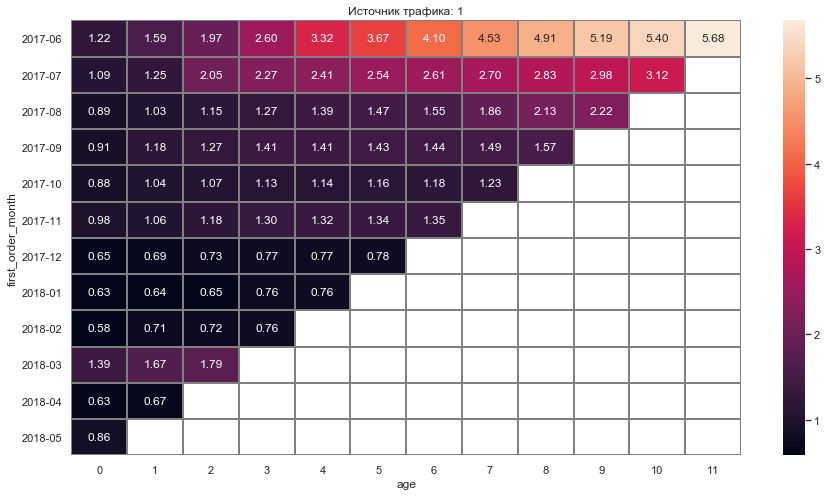

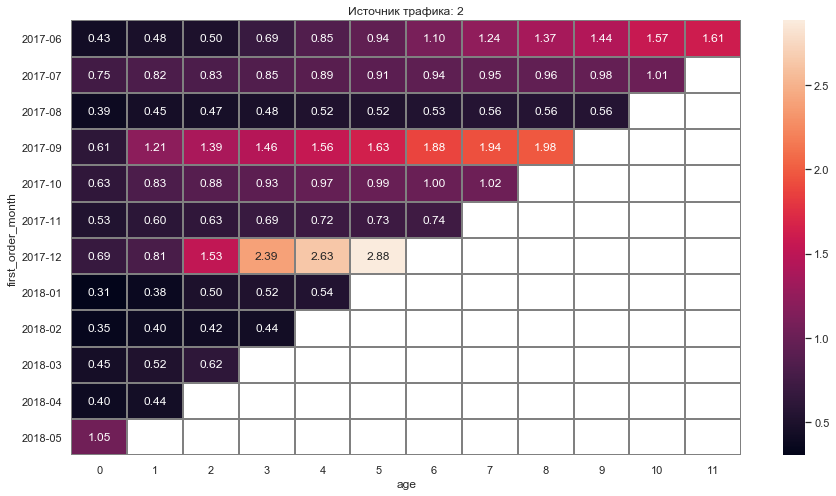

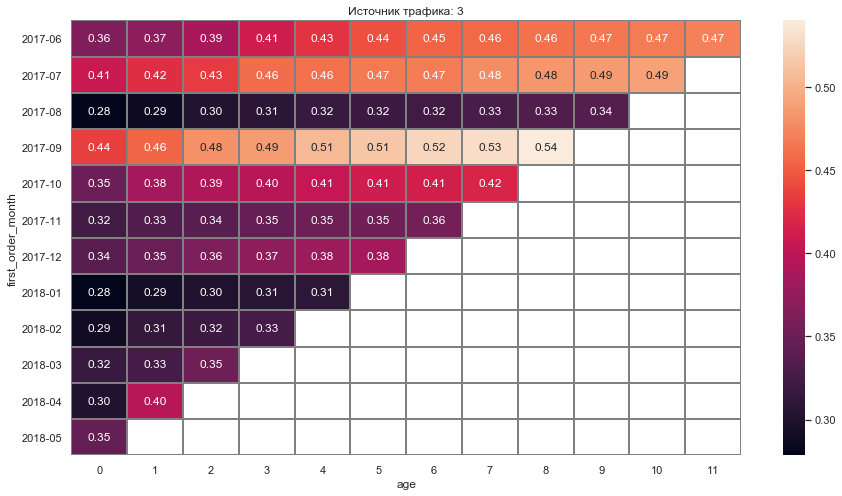

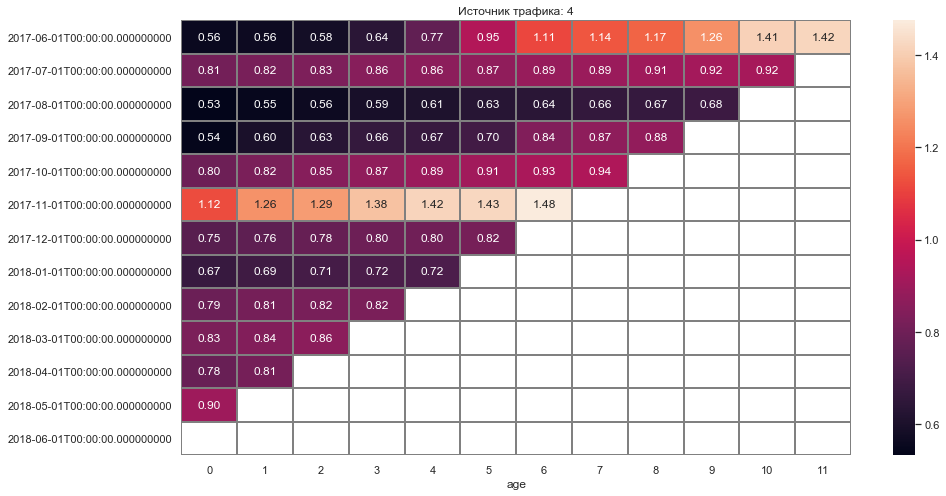

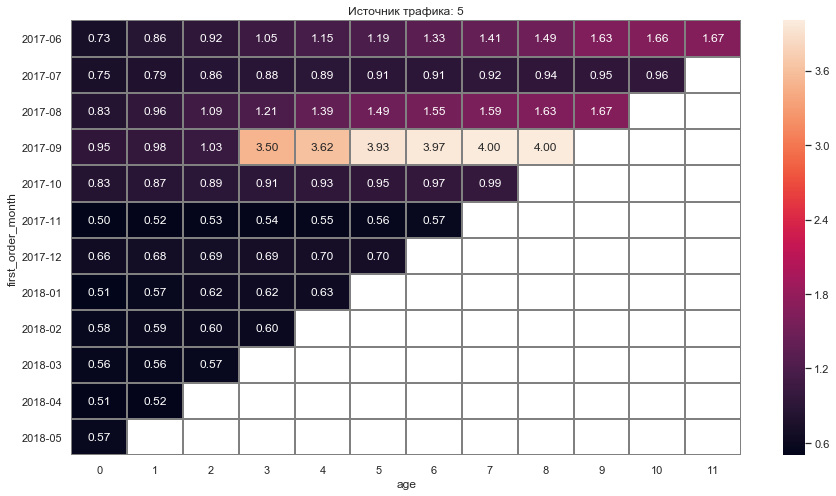

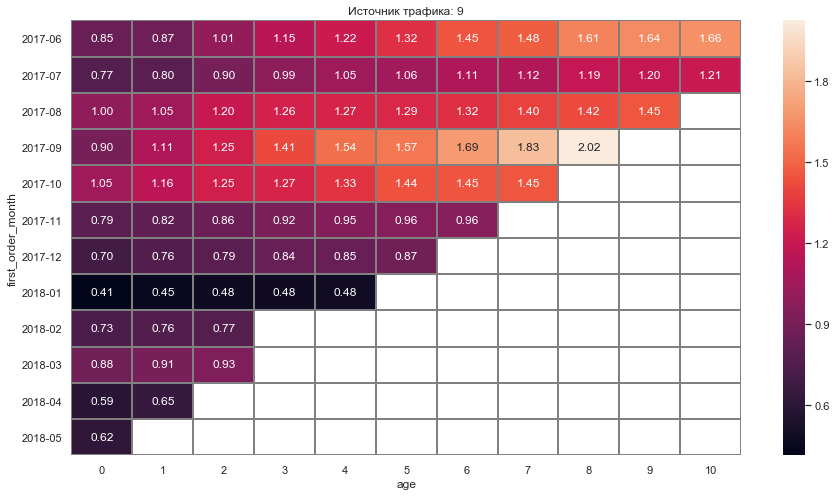

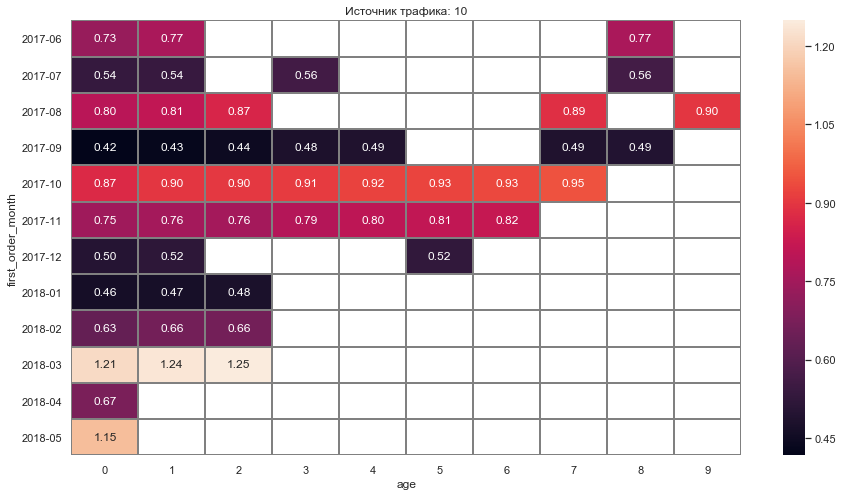

In [81]:
for source in sources:
    source_heatmap(source)

### Вывод

По данным тепловым картам можно сделать выводы о каждом источнике.

Иточник 1:
- Первые 6 когорт окупились уже на второй месяц, а последующие 6, кроме 10 когорты, так и не окупились
- Первая когорта принесла больше всего денег, далее тенденция ухудшается. 

Источник 2:
- Окупились когорты 1, 2, 4, 5, 7 и 12
- Самую быструю окупаемость продемонстрировала декабрьская когорта 2017 года.

Источник 3:
- Ниодна когорта не окупилась, скорее всего из-за высокой стоимости источника

Источник 4:
- Окупились когорты 1 и 6
- Когорты, которые не окупились показывали очень медленный прирост

Истоник 5:
- Окупились когорты 1, 3 и 4
- На 4 когорте очень резкое увелиение показателя, с 1.03 до 3.5

Источник 9:
- Окупились первые 5 когорт
- Самые высокие показатели у когорты 4

Источник 10:
- Окупились когорты 10 и 12
- Судя по тому, что в тепловой карте есть пропуски, данный источник не оплачивался все время.

# Шаг 3. Выводы и рекомендации <a id="3"></a>

### 3.1 Источники трафика  <a id="31"></a>

Первый источник трафика показал неплохие результаты, но в зимнее время он показывал небольшую окупаемость. Затраты на этот источник не такие большие, в сравнении с другим источниками.

Второй источник показал отличные результаты в январе, возможно использовать его стоит именно в это время. Но источник весьма дорогой.

Третий источник очень дорогой. Он привел много пользователей на сайт.

Четвертый источник хорошо показал себя в ноябрьской когорте, но в других либо не окупился, либо показывает долгую окупаемость. Он привел много клиентов, и стоимость за покупателя ниже средней.

Пятый источник долго окупается. в сентябрьской когорте показал высокие показатели с 3 месяца жизни.

Девятый источник самый дешевый и показал неплохие результаты окупаемости. Есть просадка у январской когорты. Источник привел сравнительно мало покупателей.

Десятый источник плохо окупаемый и имеет совсем малое количество покупателей.

Стоит отказаться от 3, 4, 5 и 10 источника, так как у них самые низкие показателя окупаемости. И несчитая 10 источника, довольно высокая стоимость привлечения

### 3.2 Обзор метрик <a id="32"></a>

##### Продуктовые метрики

Показатели уникальных пользователей:
- DAU - 907.9917582417582
- WAU - 5621.7037037037035
- MAU - 23228.416666666668

Среднее количество посещений в день - 1.08

В среднем пользователи проводят на сайте не дольше 60 секунд (ASL)

Средний Retention Rate составляет 6.5%

Из этих показателей, можно сделать вывод, что пользователи чаще всего заходят на сайт что-то посмотреть или быстро купить, возможно спустя какое-то время проверить.

##### Метрики электронной коммерции

Среднее время с первой сессии до заказа - 60 секунд

Среднее количество покупок за 6 месяцев - 1.43

Средний чек за все время - 4.83

Средний LTV за 6 месяцев - 7.82

Судя по этим показателям, можно сделать вывод, что люди покупают быстро и не часто. Скорее всего пользователи уже знают, что им надо и проводят на сайте столько времени, сколько им хватает чтобы купить услугу.

Так же, можно сказать, что услуги не так востребованы, пользователи обращаются к сервису 1-2 раза за 6 месяцев.

##### Маркетинговые метрики

Общая сумма затрат на маркетинг - 329131.62

Сумма за привлечение одного клиента составила за все время- 7.92

Учитывая когортный анализ по ROMI и эти показатели, можно сделать вывод, что маркетинг не всегда окупается. Смотря на LTV и САС, мы видим, что САС немного больше.

### 3.3 Перспективные когорты <a id="33"></a>

Проанализировов все когорты, можно выделить первые 6 когорт, а именно с июня по ноябрь включительно. Со всех источников трафика они показывали самые частые окупаемости. Особенно стоит выделить когорты июня и сентября. Помимо окупаемости у них высокие показатели пожизненной ценности клиента, высокие показатели покупок на человека и в последующий месяц жизни когорты у них самые большьшие показатели. Стоит делать упор именно на них, так как они весьма перспективные.